# Tarea 3 - Deep Reinforcement Learning (DRL)

### Setup

A continuación se importan las librerías a utilizar para la tarea, y se configura el ambiente para utilizar la GPU:

In [1]:
import torch
import random
import gym
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torch import nn, optim
from tqdm import tqdm
from gym import spaces
from gym.wrappers import AtariPreprocessing
from gym.wrappers import FrameStack
from collections import deque


# Use GPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

### Actividad 1

Comenzamos creando un wrapper personalizado para la primera parte del pre-procesamiento, que consiste en pasar la imagen a escala de grises, luego recortar la información innecesaria (por ejemplo la table de puntaje y los bordes), y finalmente reducir su resolución desde 210x160 a 84x84:

In [2]:
def _process_frame84(frame):
    frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    frame = frame[:155, 10:]
    x_t = cv2.resize(frame, (84, 84), interpolation=cv2.INTER_AREA)
    return x_t.astype(np.uint8)

class ProcessFrame84(gym.Wrapper):
    def __init__(self, env=None):
        super(ProcessFrame84, self).__init__(env)
        self.observation_space = spaces.Box(low=0, high=255, shape=(84, 84))

    def step(self, action):
        obs, reward, done, info = self.env.step(action)
        return _process_frame84(obs), reward, done, info

    def reset(self):
        return _process_frame84(self.env.reset())

Ahora se realiza el resto del pre-procesamiento. Primero se inicializa el entorno del juego **Enduro**, y se hace uso del argumento ``frameskip`` para poder tomar decisiones cada 4 frames del juego en vez de por cada una, agilizando así el entrenamiento sin bajar el rendimiento final. Además, se aplica el wrapper de gym llamado ``FrameStack``, que permite llevar un historial de los últimos 4 estados del juego al momento de tener que tomar una decisión. Esto último es sumamente útil, ya que al observar distintas frames contiguas, le permite al algoritmo **identificar las direcciones del movimiento** de los objetos en pantalla, distinguiendo así entre moverse en una dirección u otra al elegir la acción:

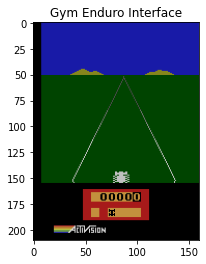

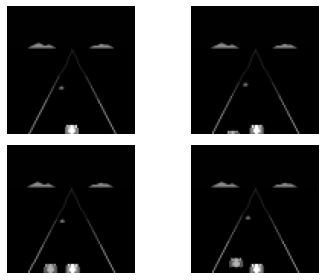

(4, 84, 84)


In [3]:
# Create environment
game = 'Enduro-v0'
env = gym.make(game, frameskip=4)

# For reproducibility
seed = 0
env.seed(seed)

obs = env.reset()

plt.imshow(np.squeeze(obs))
plt.title('Gym Enduro Interface')
plt.show()

env = ProcessFrame84(env)
env = FrameStack(env, num_stack=4)
obs = env.reset()

for _ in range(100):
    action = random.randint(0, env.action_space.n - 1)
    obs, reward, done, info = env.step(action)

plt.figure()
plt.subplot(2, 2, 1)
plt.imshow(np.squeeze(np.array(obs)[0,:,:]), cmap='gray')
plt.axis('off')
plt.subplot(2, 2, 2)
plt.imshow(np.squeeze(np.array(obs)[1,:,:]), cmap='gray')
plt.axis('off')
plt.subplot(2, 2, 3)
plt.imshow(np.squeeze(np.array(obs)[2,:,:]), cmap='gray')
plt.axis('off')
plt.subplot(2, 2, 4)
plt.imshow(np.squeeze(np.array(obs)[3,:,:]), cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()
print(obs.shape)

Finalmente, podemos ver que la cantidad de acciones posibles para el jugador son 9 (moverse en las 4 direcciones + las 4 diagonales y no hacer nada).

In [4]:
print(env.action_space.n)

9


### Actividad 2

Para la implementación, se parte por crear la clase ``ReplayMemory``, que corresponde al **buffer de memoria** que almacenará la experiencia adquirida durante el entrenamiento. Esta clase funciona como una **cola FIFO**, y además permite sacar muestras aleatorias de su población de experiencias:

In [5]:
# Replay buffer
class ReplayMemory:
    def __init__(self, capacity):
        self.memory = deque([], maxlen=capacity)
    
    # Saves a transition
    def push(self, state, action, next_state, reward, done):
        experience = (state, action, reward, next_state, done)
        self.memory.append(experience)

    # Samples a transition with a defined batch size
    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)

A continuación se define el modelo de la **Dueling Deep Q-Network** a utilizar. Este consiste en las capas convolucionales iniciales (que aprenden a detectar los objetos en las imágenes del juego), el stream del valor (que aprende a estimar el valor del estado actual), y el stream de las ventajas (que aprende la ventaja obtenida al realizar una cierta acción en el estado actual). En el método ``forward``, se pasa el estado por todas estas capas, para finalmente utilizar la fórmula que **estima los valores Q** para cada acción combinando el valor y las ventajas asociadas:

In [6]:
# Dueling DQN model
class Dueling_DQN(nn.Module):
    def __init__(self, in_channels, num_actions):
        super(Dueling_DQN, self).__init__()
        self.num_actions = num_actions
        
        # Convolutional layers
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=32, kernel_size=8, stride=4),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1),
            nn.ReLU()
        )
        
        # Value layers
        self.value_stream = nn.Sequential(
            nn.Linear(in_features=7*7*64, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512, out_features=1)
        )
        
        # Advantage layers
        self.advantage_stream = nn.Sequential(
            nn.Linear(in_features=7*7*64, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512, out_features=num_actions)
        )

    # Forward pass
    def forward(self, x):
        features = self.conv(x)  # Conv features from frames
        features = features.view(features.size(0), -1)
        values = self.value_stream(features)  # Value estimations
        advantages = self.advantage_stream(features)  # Advantage estimations
        q_values = values + (advantages - advantages.mean())  # Q-Value estimations
        return q_values

Con el modelo definido, ahora podemos preparar todo para el entrenamiento. Se setean los valores de cada hiperparámetro, incluyendo el tamaño del batch, el tamaño del buffer de memoria, la cantidad de pasos antes de empezar a aprender, la frecuencia de actualización de ambas redes (estimación y target), el parámetro de descuento (gamma), la tasa de aprendizaje, la cantidad de épocas y el tamaño de cada una medido en cantidad de pasos. Además, se instancian las 2 redes, una para **estimar los valores de Q** y otra para **estimar el target** y guiar el aprendizaje de la primera. También se define el **optimizador** (en este caso Adam) y el **criterio de pérdida** (en este caso el error cuadrático medio):

In [7]:
# Hyper-parameters
replay_buffer_size = 500000
batch_size = 32
learning_starts = 50000  # Initial steps for memory filling
learning_freq = 4  # Frequency to execute backpropagation
frame_history_len = 4  # Frames per state
target_update_freq = 10000  # Frequency of updating target network weights
gamma = 0.99  # Discounted return
LR = 0.00025  # Learning rate

# Input data
in_channels = frame_history_len
input_shape = (84, 84)
num_actions = env.action_space.n

# Define Q-target and Q-estimation networks
Q = Dueling_DQN(in_channels, num_actions).to(device)
Q_target = Dueling_DQN(in_channels, num_actions).to(device)

# Optimizer
optimizer = optim.Adam(Q.parameters(), lr=LR)

# Loss criterion
criterion = nn.MSELoss()

# State memory
replay_memory = ReplayMemory(replay_buffer_size)

# Config
LOG_EVERY_N_STEPS = 50000  # Frequency for result display
STEPS_PER_EPOCH = 250000  # Steps per epoch
N_EPOCHS = 20  # Epochs

A continuación se construye la función que realizará el entrenamiento del modelo. Esta lleva la cuenta de la cantidad de pasos, cantidad de actualizaciones de los parámetros de la red Q, así como el score acumulado de cada episodio. Lo primero que ocurre en cada paso es la **decisión de la acción a realizar.** En las primeras 50000 iteraciones, esta acción es **aleatoria.** Luego de este período, la acción puede ser aleatoria, o bien puede ser indicada por la red Q, decisión que se toma en base a una **estrategia epsilon greedy** (que usa un valor epsilon que disminuye linealmente desde 1 a 0.1 durante el primer millón de pasos). Tras la decisión de la acción, se aplica sobre el entorno del juego para obtener la información del **estado resultante** (y además se guarda en el buffer de memoria). Luego de este paso, y cuando ya se terminó el período inicial de 50000 pasos, se procede a realizar el aprendizaje mediante **Experience Replay**, utilizando una muestra aleatoria de experiencias obtenida desde el **buffer de memoria.** Cada 10000 actualizaciones de los pesos de la red Q, se **copian los valores de estos hacia la red Q target,** buscando guiar el entrenamiento de la red Q con un nuevo label estimado. Finalmente, al terminar cada época, se guarda el **score promedio de los últimos 100 episodios, así como el mejor score entre estos:**

In [8]:
# Run training for a number of epochs with fixed length
def run_training(n_epochs, epoch_length):
    # Setup for training
    last_obs = env.reset()
    t = 0  # Total steps
    updates = 0  # Total weight updates on estimation network
    acc_score = 0  # Accumulated score for each episode
    episode_scores = deque([], maxlen=100)  # Save scores for the last 100 episodes
    epoch_scores = {'avg': [], 'best': []}  # Save scores for each epoch
    eps = 1.0  # Epsilon parameter for greedy exploration
    best_avg = 0  # Best avg for the last 100 episodes

    # Epochs
    for epoch in tqdm(range(n_epochs), position=0, leave=True):
        # Steps
        for step in tqdm(range(epoch_length), position=0, leave=True):

            # Before learning starts, choose actions randomly
            if t < learning_starts:
                action = np.random.randint(num_actions)
            else:  # Epsilon greedy exploration
                sample = random.random()
                if sample > eps:  # Exploit
                    with torch.no_grad():  # Get next action with Q-network
                        current_state = torch.from_numpy(last_obs.__array__() / 255).float().unsqueeze(0).to(device)
                        action_values = Q.forward(current_state)
                        action = torch.argmax(action_values, axis=1).item()
                else:  # Explore
                    action = np.random.randint(num_actions)

            # Execute step
            obs, reward, done, info = env.step(action)
            replay_memory.push(last_obs, action, obs, reward, done)  # Update memory with last obs
            acc_score += reward  # Accumulate reward for this episode
            if acc_score < 0:
                acc_score = 0

            # Episode is finished
            if done:
                obs = env.reset()
                episode_scores.append(acc_score)  # Save episode reward
                acc_score = 0

            # Update last observation
            last_obs = obs

            # Perform experience replay and train the network
            if (t >= learning_starts and t % learning_freq == 0):
                # Get transitions
                transitions = replay_memory.sample(batch_size)
                obs_t, act_t, rew_t, next_obs, done_mask = zip(*transitions)

                # Convert arrays to tensors and normalize
                states = torch.from_numpy(np.array(obs_t, dtype=np.float32) / 255).to(device)
                actions = torch.from_numpy(np.array(act_t, dtype=np.int64)).to(device)
                rewards = torch.from_numpy(np.array(rew_t, dtype=np.float32)).to(device)
                next_states = torch.from_numpy(np.array(next_obs, dtype=np.float32) / 255).to(device)

                # Get predictions
                current_q = Q.forward(states).gather(1, actions.unsqueeze(1)).squeeze(1)
                with torch.no_grad():
                    q_labels = Q_target.forward(next_states)
                expected_q = rewards + gamma * torch.max(q_labels, 1)[0]

                # Loss calculation
                loss = criterion(current_q, expected_q)

                # Backwards pass
                optimizer.zero_grad()
                loss.backward()

                # Update
                optimizer.step()
                updates += 1

                # Update target network
                if not (updates % target_update_freq):
                    Q_target.load_state_dict(Q.state_dict())

            # Show current results: best/average score for the last 100 episodes
            if t % LOG_EVERY_N_STEPS == 0:
                best = 0.0
                avg = 0.0
                if episode_scores:
                    best = max(episode_scores)
                    avg = sum(episode_scores) / len(episode_scores)
                print(f'Epoch: {epoch + 1}, Best Recent Score: {round(best, 2)}, Average Recent Score: {round(avg, 2)}')

            # Increase step counter
            t += 1

            # Update epsilon value for threshold
            eps = max(1.0 - ((t * 0.9) / 1000000), 0.1)

        # Save epoch scores
        epoch_avg = sum(episode_scores) / len(episode_scores)
        epoch_scores['avg'].append(epoch_avg)
        epoch_best = max(episode_scores)
        epoch_scores['best'].append(epoch_best)

        # Save model state if needed
        if epoch_avg > best_avg:
            best_avg = epoch_avg
            torch.save(Q.state_dict(), 'Q.pt')
            torch.save(Q_target.state_dict(), 'target.pt')
    return epoch_scores

Entrenamos el modelo durante 20 épocas, cada una con 250000 pasos:

In [9]:
epoch_data = run_training(N_EPOCHS, STEPS_PER_EPOCH)

  0%|                                                                                                               | 90/250000 [00:00<09:28, 439.77it/s]

Epoch: 1, Best Recent Score: 0.0, Average Recent Score: 0.0


 20%|█████████████████████▊                                                                                       | 50028/250000 [01:54<36:10, 92.13it/s]

Epoch: 1, Best Recent Score: 0.0, Average Recent Score: 0.0


 40%|██████████████████████████████████████████▊                                                                | 100029/250000 [06:09<13:09, 189.90it/s]

Epoch: 1, Best Recent Score: 0.0, Average Recent Score: 0.0


 60%|████████████████████████████████████████████████████████████████▏                                          | 150043/250000 [10:29<08:28, 196.50it/s]

Epoch: 1, Best Recent Score: 0.0, Average Recent Score: 0.0


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200025/250000 [14:54<04:32, 183.38it/s]

Epoch: 1, Best Recent Score: 0.0, Average Recent Score: 0.0


  0%|                                                                                                               | 17/250000 [00:00<27:00, 154.27it/s]

Epoch: 2, Best Recent Score: 0.0, Average Recent Score: 0.0


 20%|█████████████████████▌                                                                                      | 50021/250000 [04:33<18:02, 184.69it/s]

Epoch: 2, Best Recent Score: 0.0, Average Recent Score: 0.0


 40%|██████████████████████████████████████████▊                                                                | 100026/250000 [09:14<14:55, 167.51it/s]

Epoch: 2, Best Recent Score: 0.0, Average Recent Score: 0.0


 60%|████████████████████████████████████████████████████████████████▏                                          | 150018/250000 [14:07<10:15, 162.56it/s]

Epoch: 2, Best Recent Score: 0.0, Average Recent Score: 0.0


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200033/250000 [19:02<04:58, 167.57it/s]

Epoch: 2, Best Recent Score: 0.0, Average Recent Score: 0.0


  0%|                                                                                                               | 17/250000 [00:00<25:51, 161.08it/s]

Epoch: 3, Best Recent Score: 0.0, Average Recent Score: 0.0


 20%|█████████████████████▌                                                                                      | 50024/250000 [05:01<19:26, 171.46it/s]

Epoch: 3, Best Recent Score: 0.0, Average Recent Score: 0.0


 40%|██████████████████████████████████████████▊                                                                | 100023/250000 [10:04<14:38, 170.75it/s]

Epoch: 3, Best Recent Score: 0.0, Average Recent Score: 0.0


 60%|████████████████████████████████████████████████████████████████▏                                          | 150036/250000 [15:09<09:58, 166.90it/s]

Epoch: 3, Best Recent Score: 3.0, Average Recent Score: 0.04


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200022/250000 [20:17<05:06, 162.97it/s]

Epoch: 3, Best Recent Score: 3.0, Average Recent Score: 0.05


  0%|                                                                                                               | 33/250000 [00:00<27:01, 154.17it/s]

Epoch: 4, Best Recent Score: 5.0, Average Recent Score: 0.13


 20%|█████████████████████▌                                                                                      | 50027/250000 [05:12<20:27, 162.97it/s]

Epoch: 4, Best Recent Score: 5.0, Average Recent Score: 0.13


 40%|██████████████████████████████████████████▊                                                                | 100021/250000 [10:25<15:52, 157.45it/s]

Epoch: 4, Best Recent Score: 5.0, Average Recent Score: 0.2


 60%|████████████████████████████████████████████████████████████████▏                                          | 150016/250000 [15:43<10:44, 155.10it/s]

Epoch: 4, Best Recent Score: 5.0, Average Recent Score: 0.22


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200018/250000 [21:03<05:19, 156.33it/s]

Epoch: 4, Best Recent Score: 5.0, Average Recent Score: 0.2


  0%|                                                                                                               | 14/250000 [00:00<32:58, 126.33it/s]

Epoch: 5, Best Recent Score: 5.0, Average Recent Score: 0.25


 20%|█████████████████████▌                                                                                      | 50027/250000 [05:24<21:35, 154.39it/s]

Epoch: 5, Best Recent Score: 4.0, Average Recent Score: 0.19


 40%|██████████████████████████████████████████▊                                                                | 100030/250000 [10:49<16:33, 151.01it/s]

Epoch: 5, Best Recent Score: 33.0, Average Recent Score: 0.71


 60%|████████████████████████████████████████████████████████████████▏                                          | 150021/250000 [16:13<10:46, 154.72it/s]

Epoch: 5, Best Recent Score: 40.0, Average Recent Score: 1.52


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200025/250000 [21:37<05:23, 154.61it/s]

Epoch: 5, Best Recent Score: 40.0, Average Recent Score: 1.54


  0%|                                                                                                               | 16/250000 [00:00<26:45, 155.69it/s]

Epoch: 6, Best Recent Score: 40.0, Average Recent Score: 2.64


 20%|█████████████████████▌                                                                                      | 50019/250000 [05:23<21:22, 155.93it/s]

Epoch: 6, Best Recent Score: 40.0, Average Recent Score: 3.82


 40%|██████████████████████████████████████████▊                                                                | 100022/250000 [10:46<16:15, 153.81it/s]

Epoch: 6, Best Recent Score: 40.0, Average Recent Score: 6.08


 60%|████████████████████████████████████████████████████████████████▏                                          | 150026/250000 [16:09<10:43, 155.42it/s]

Epoch: 6, Best Recent Score: 44.0, Average Recent Score: 7.66


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200033/250000 [21:32<05:16, 157.67it/s]

Epoch: 6, Best Recent Score: 44.0, Average Recent Score: 8.84


  0%|                                                                                                               | 14/250000 [00:00<30:34, 136.25it/s]

Epoch: 7, Best Recent Score: 78.0, Average Recent Score: 11.98


 20%|█████████████████████▌                                                                                      | 50034/250000 [05:24<21:23, 155.82it/s]

Epoch: 7, Best Recent Score: 96.0, Average Recent Score: 18.43


 40%|██████████████████████████████████████████▊                                                                | 100022/250000 [10:48<16:02, 155.87it/s]

Epoch: 7, Best Recent Score: 106.0, Average Recent Score: 24.59


 60%|████████████████████████████████████████████████████████████████▏                                          | 150025/250000 [16:10<10:39, 156.44it/s]

Epoch: 7, Best Recent Score: 140.0, Average Recent Score: 34.83


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200018/250000 [21:35<05:22, 154.75it/s]

Epoch: 7, Best Recent Score: 146.0, Average Recent Score: 46.72


  0%|                                                                                                               | 17/250000 [00:00<28:22, 146.84it/s]

Epoch: 8, Best Recent Score: 154.0, Average Recent Score: 59.87


 20%|█████████████████████▌                                                                                      | 50030/250000 [05:23<21:11, 157.30it/s]

Epoch: 8, Best Recent Score: 160.0, Average Recent Score: 74.59


 40%|██████████████████████████████████████████▊                                                                | 100024/250000 [10:46<16:04, 155.57it/s]

Epoch: 8, Best Recent Score: 371.0, Average Recent Score: 90.53


 60%|████████████████████████████████████████████████████████████████▏                                          | 150025/250000 [16:09<10:41, 155.73it/s]

Epoch: 8, Best Recent Score: 371.0, Average Recent Score: 101.45


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200033/250000 [21:33<05:19, 156.33it/s]

Epoch: 8, Best Recent Score: 371.0, Average Recent Score: 113.59


  0%|                                                                                                               | 13/250000 [00:00<34:50, 119.60it/s]

Epoch: 9, Best Recent Score: 371.0, Average Recent Score: 122.27


 20%|█████████████████████▌                                                                                      | 50026/250000 [05:22<21:36, 154.21it/s]

Epoch: 9, Best Recent Score: 371.0, Average Recent Score: 134.25


 40%|██████████████████████████████████████████▊                                                                | 100035/250000 [10:45<16:37, 150.29it/s]

Epoch: 9, Best Recent Score: 584.0, Average Recent Score: 150.43


 60%|████████████████████████████████████████████████████████████████▏                                          | 150033/250000 [16:09<10:46, 154.70it/s]

Epoch: 9, Best Recent Score: 584.0, Average Recent Score: 166.7


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200018/250000 [21:32<05:23, 154.71it/s]

Epoch: 9, Best Recent Score: 584.0, Average Recent Score: 179.37


  0%|                                                                                                               | 32/250000 [00:00<26:44, 155.76it/s]

Epoch: 10, Best Recent Score: 584.0, Average Recent Score: 192.15


 20%|█████████████████████▌                                                                                      | 50025/250000 [05:22<21:17, 156.57it/s]

Epoch: 10, Best Recent Score: 584.0, Average Recent Score: 211.54


 40%|██████████████████████████████████████████▊                                                                | 100024/250000 [10:46<16:10, 154.50it/s]

Epoch: 10, Best Recent Score: 584.0, Average Recent Score: 230.41


 60%|████████████████████████████████████████████████████████████████▏                                          | 150018/250000 [16:10<10:43, 155.31it/s]

Epoch: 10, Best Recent Score: 584.0, Average Recent Score: 252.22


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200027/250000 [21:34<05:20, 156.03it/s]

Epoch: 10, Best Recent Score: 584.0, Average Recent Score: 273.46


  0%|                                                                                                               | 16/250000 [00:00<26:43, 155.87it/s]

Epoch: 11, Best Recent Score: 723.0, Average Recent Score: 296.02


 20%|█████████████████████▌                                                                                      | 50021/250000 [05:23<21:16, 156.62it/s]

Epoch: 11, Best Recent Score: 723.0, Average Recent Score: 314.19


 40%|██████████████████████████████████████████▊                                                                | 100029/250000 [10:47<16:05, 155.34it/s]

Epoch: 11, Best Recent Score: 723.0, Average Recent Score: 331.02


 60%|████████████████████████████████████████████████████████████████▏                                          | 150022/250000 [16:11<10:47, 154.30it/s]

Epoch: 11, Best Recent Score: 723.0, Average Recent Score: 349.01


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200026/250000 [21:33<05:22, 154.83it/s]

Epoch: 11, Best Recent Score: 723.0, Average Recent Score: 359.77


  0%|                                                                                                               | 13/250000 [00:00<33:34, 124.11it/s]

Epoch: 12, Best Recent Score: 781.0, Average Recent Score: 376.88


 20%|█████████████████████▌                                                                                      | 50026/250000 [05:23<21:44, 153.27it/s]

Epoch: 12, Best Recent Score: 781.0, Average Recent Score: 395.32


 40%|██████████████████████████████████████████▊                                                                | 100030/250000 [10:47<15:57, 156.66it/s]

Epoch: 12, Best Recent Score: 781.0, Average Recent Score: 413.17


 60%|████████████████████████████████████████████████████████████████▏                                          | 150018/250000 [16:09<10:52, 153.29it/s]

Epoch: 12, Best Recent Score: 781.0, Average Recent Score: 427.37


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200029/250000 [21:32<05:20, 156.03it/s]

Epoch: 12, Best Recent Score: 781.0, Average Recent Score: 439.86


  0%|                                                                                                               | 15/250000 [00:00<27:59, 148.87it/s]

Epoch: 13, Best Recent Score: 781.0, Average Recent Score: 445.69


 20%|█████████████████████▌                                                                                      | 50026/250000 [05:26<21:45, 153.12it/s]

Epoch: 13, Best Recent Score: 781.0, Average Recent Score: 458.41


 40%|██████████████████████████████████████████▊                                                                | 100013/250000 [10:52<16:18, 153.22it/s]

Epoch: 13, Best Recent Score: 781.0, Average Recent Score: 469.17


 60%|████████████████████████████████████████████████████████████████▏                                          | 150028/250000 [16:19<10:47, 154.28it/s]

Epoch: 13, Best Recent Score: 781.0, Average Recent Score: 479.49


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200028/250000 [21:43<05:17, 157.43it/s]

Epoch: 13, Best Recent Score: 781.0, Average Recent Score: 480.77


  0%|                                                                                                               | 15/250000 [00:00<30:24, 136.99it/s]

Epoch: 14, Best Recent Score: 800.0, Average Recent Score: 492.5


 20%|█████████████████████▌                                                                                      | 50025/250000 [05:22<21:08, 157.64it/s]

Epoch: 14, Best Recent Score: 800.0, Average Recent Score: 502.95


 40%|██████████████████████████████████████████▊                                                                | 100022/250000 [10:44<15:58, 156.52it/s]

Epoch: 14, Best Recent Score: 800.0, Average Recent Score: 504.34


 60%|████████████████████████████████████████████████████████████████▏                                          | 150016/250000 [16:06<10:28, 159.16it/s]

Epoch: 14, Best Recent Score: 800.0, Average Recent Score: 504.41


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200030/250000 [21:29<05:25, 153.70it/s]

Epoch: 14, Best Recent Score: 800.0, Average Recent Score: 509.45


  0%|                                                                                                               | 17/250000 [00:00<27:21, 152.29it/s]

Epoch: 15, Best Recent Score: 800.0, Average Recent Score: 510.25


 20%|█████████████████████▌                                                                                      | 50031/250000 [05:23<21:23, 155.81it/s]

Epoch: 15, Best Recent Score: 800.0, Average Recent Score: 508.44


 40%|██████████████████████████████████████████▊                                                                | 100018/250000 [10:45<16:00, 156.19it/s]

Epoch: 15, Best Recent Score: 800.0, Average Recent Score: 503.5


 60%|████████████████████████████████████████████████████████████████▏                                          | 150031/250000 [16:09<10:53, 153.06it/s]

Epoch: 15, Best Recent Score: 800.0, Average Recent Score: 504.6


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200030/250000 [21:31<05:29, 151.59it/s]

Epoch: 15, Best Recent Score: 800.0, Average Recent Score: 510.05


  0%|                                                                                                               | 16/250000 [00:00<26:45, 155.71it/s]

Epoch: 16, Best Recent Score: 800.0, Average Recent Score: 511.32


 20%|█████████████████████▌                                                                                      | 50018/250000 [05:23<21:28, 155.15it/s]

Epoch: 16, Best Recent Score: 800.0, Average Recent Score: 507.22


 40%|██████████████████████████████████████████▊                                                                | 100022/250000 [10:46<16:34, 150.82it/s]

Epoch: 16, Best Recent Score: 800.0, Average Recent Score: 505.9


 60%|████████████████████████████████████████████████████████████████▏                                          | 150030/250000 [16:09<10:38, 156.48it/s]

Epoch: 16, Best Recent Score: 800.0, Average Recent Score: 504.15


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200024/250000 [21:33<05:14, 158.66it/s]

Epoch: 16, Best Recent Score: 800.0, Average Recent Score: 494.16


  0%|                                                                                                               | 17/250000 [00:00<27:49, 149.76it/s]

Epoch: 17, Best Recent Score: 772.0, Average Recent Score: 485.62


 20%|█████████████████████▌                                                                                      | 50013/250000 [05:24<21:52, 152.33it/s]

Epoch: 17, Best Recent Score: 772.0, Average Recent Score: 482.48


 40%|██████████████████████████████████████████▊                                                                | 100022/250000 [10:48<16:20, 152.89it/s]

Epoch: 17, Best Recent Score: 772.0, Average Recent Score: 473.2


 60%|████████████████████████████████████████████████████████████████▏                                          | 150021/250000 [16:11<10:45, 154.82it/s]

Epoch: 17, Best Recent Score: 772.0, Average Recent Score: 472.12


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200030/250000 [21:35<05:33, 149.84it/s]

Epoch: 17, Best Recent Score: 772.0, Average Recent Score: 469.25


  0%|                                                                                                               | 17/250000 [00:00<28:11, 147.81it/s]

Epoch: 18, Best Recent Score: 772.0, Average Recent Score: 469.83


 20%|█████████████████████▌                                                                                      | 50035/250000 [05:24<21:31, 154.84it/s]

Epoch: 18, Best Recent Score: 772.0, Average Recent Score: 480.33


 40%|██████████████████████████████████████████▊                                                                | 100023/250000 [10:47<16:25, 152.14it/s]

Epoch: 18, Best Recent Score: 772.0, Average Recent Score: 476.53


 60%|████████████████████████████████████████████████████████████████▏                                          | 150025/250000 [16:12<10:41, 155.73it/s]

Epoch: 18, Best Recent Score: 767.0, Average Recent Score: 480.0


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200023/250000 [21:37<05:38, 147.48it/s]

Epoch: 18, Best Recent Score: 767.0, Average Recent Score: 475.17


  0%|                                                                                                               | 30/250000 [00:00<29:04, 143.27it/s]

Epoch: 19, Best Recent Score: 767.0, Average Recent Score: 472.19


 20%|█████████████████████▌                                                                                      | 50026/250000 [05:30<21:35, 154.39it/s]

Epoch: 19, Best Recent Score: 767.0, Average Recent Score: 467.66


 40%|██████████████████████████████████████████▊                                                                | 100030/250000 [10:59<16:24, 152.40it/s]

Epoch: 19, Best Recent Score: 767.0, Average Recent Score: 460.44


 60%|████████████████████████████████████████████████████████████████▏                                          | 150016/250000 [16:30<10:43, 155.47it/s]

Epoch: 19, Best Recent Score: 767.0, Average Recent Score: 465.51


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200021/250000 [21:58<05:27, 152.81it/s]

Epoch: 19, Best Recent Score: 767.0, Average Recent Score: 464.8


  0%|                                                                                                               | 16/250000 [00:00<30:05, 138.43it/s]

Epoch: 20, Best Recent Score: 767.0, Average Recent Score: 472.85


 20%|█████████████████████▌                                                                                      | 50032/250000 [05:26<21:42, 153.50it/s]

Epoch: 20, Best Recent Score: 767.0, Average Recent Score: 478.2


 40%|██████████████████████████████████████████▊                                                                | 100027/250000 [10:53<16:09, 154.72it/s]

Epoch: 20, Best Recent Score: 767.0, Average Recent Score: 482.74


 60%|████████████████████████████████████████████████████████████████▏                                          | 150025/250000 [16:20<10:43, 155.33it/s]

Epoch: 20, Best Recent Score: 767.0, Average Recent Score: 479.89


 80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 200025/250000 [21:46<05:31, 150.90it/s]

Epoch: 20, Best Recent Score: 767.0, Average Recent Score: 477.81


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [8:47:27<00:00, 1582.35s/it]


El entrenamiento concluye tras unas **10 horas,** logrando scores bastante altos en el juego **(alrededor de 400-500 en promedio por episodio).**

### Actividad 3

La arquitectura **Dueling DQN** funciona separando el **valor del estado actual** de la **ventaja** obtenida al realizar cada acción en este estado. Esto le permite identificar los estados **valiosos** sin tener que aprender el efecto de cada acción posible en cada estado. Esto es especialmente útil en estados donde la acción a realizar cobra **poca relevancia en el juego** en sí, o también en estados donde existen acciones que tienen efectos redundantes/similares sobre el juego. 

En el caso de **Enduro**, hay varios momentos en los que los autos rivales **no aparecen en pantalla** (o están muy lejos), por lo que la arquitectura permite darse cuenta de esto y simplemente **enfocarse en el valor del estado actual**, ignorando las acciones innecesarias. En otros casos, al intentar **esquivar** autos cercanos, los valores de **ventaja de cada acción** son aprendidos de forma más especializada, permitiendo escoger mejor la acción que genera la **mayor ventaja respecto al estado actual** del juego, **sin enfocarse mucho en el valor del estado** en sí. Se podría pensar como que el stream del valor se usa a **largo plazo** y el stream de las ventajas se usa a **corto plazo.**

### Actividad 4

La ventaja de usar un buffer de memoria corresponde a la posibilidad de aplicar la técnica conocida como **Experience Replay**. Esta técnica permite **aprender por medio de las experiencias pasadas** del modelo, sacando muestras al azar de esta población. Esto trae el gran beneficio de que se **elimina la dependencia de la correlación entre estados consecutivos,** ahora todo estado que se haya experimentado puede aportar conocimiento sobre lo que está bien y lo que está mal realizar, con el fin de mejorar el rendimiento a futuro (sin importar si fueron estados que ocurrieron consecutivamente, o estados completamente separados en la ejecución del juego). Además, se **mejora la estabilidad** de los pesos de la red, debido a que estos se actualizan tomando un **promedio de experiencias pasadas,** evitando así aprender sesgos y luego tener que eliminarlos oscilando fuertemente en las estimaciones.

La intuición indica que la mejor estrategia al comienzo del entrenamiento (cuando no se tiene conocimiento sobre el problema), es **explorar todas las posibilidades de forma aleatoria**, recopilando cada experiencia obtenida en la memoria para después **aprender de ellas.** Una vez que el modelo tiene la suficiente información, empieza a **estimar bien los valores de Q,** eligiendo acciones que mejoran el rendimiento en el juego, por lo que en este punto **conviene dejar que la red misma seleccione la mayoría de veces la acción a realizar, lo que se conoce como explotación** (con un poco de azar para explorar rutas ligeramente distintas). Para simular esta intuición, se utiliza la estrategia **epsilon-greedy,** donde el valor de epsilon comienza grande para que se realice **exploración casi el 100% del tiempo,** y a medida que este disminuye se transiciona a realizar **explotación casi el 100% del tiempo.**

### Actividad 5

Definimos una función para calcular la cantidad de parámetros entrenables de un modelo:

In [17]:
# Check the number of trainable parameters in a model
def num_trainable_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

La aplicamos sobre el modelo utilizado:

In [26]:
dueling_params = num_trainable_parameters(Q)
print(f'Dueling DQN Params: {dueling_params}')

Dueling DQN Params: 3295402


Nuestro modelo tiene un total de **3295402** parámetros entrenables. Ahora definimos otro modelo que corresponde a una red **DQN** clásica:

In [21]:
# Classic DQN model
class DQN(nn.Module):
    def __init__(self, in_channels, num_actions):
        super(DQN, self).__init__()
        self.num_actions = num_actions
        
        # Convolutional layers
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=32, kernel_size=8, stride=4),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1),
            nn.ReLU()
        )
        
        # FC layers
        self.fc = nn.Sequential(
            nn.Linear(in_features=7*7*64, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512, out_features=num_actions)
        )

    # Forward pass
    def forward(self, x):
        features = self.conv(x)  # Conv features from frames
        features = features.view(features.size(0), -1)
        q_values = self.fc(features)  # Q-value estimations
        return q_values

Comparamos la cantidad de parámetros de este modelo con el nuestro:

In [27]:
classic_dqn = DQN(in_channels, num_actions)
classic_params = num_trainable_parameters(classic_dqn)
print(f'Classic DQN Params: {classic_params}')
print(f'Difference: {dueling_params - classic_params}')

Classic DQN Params: 1688745
Difference: 1606657


Se puede observar que el modelo **Dueling DQN** tiene **1606657** parámetros más que el modelo **DQN** original, casi duplicando su cantidad.

### Actividad 6

Se utilizaron los siguientes hiperparámetros:

* **Tamaño del Buffer de Memoria:** 500000 entradas, de forma de ahorrar memoria RAM sin afectar el rendimiento de forma negativa.
* **Tamaño de Batch:** 32, al igual que en el paper original de DQN sobre juegos de Atari.
* **Pasos Antes de Comenzar a Aprender:** 50000 pasos al comienzo, en los que sólo se recopilan experiencias en la memoria.
* **Frecuencia de Aprendizaje:** cada 4 pasos, ya que recién en esa cantidad se verán reflejados los efectos de las acciones en el juego.
* **Frames por Estado:** 4 frames, con esto basta para que la red pueda observar la dirección de movimiento de los objetos.
* **Frecuencia de Actualización del Target:** cada 10000 actualizaciones de la red Q, se actualiza la red Q target. De esta forma se aumenta la estabilidad al usar labels dinámicos que duran un tiempo no menor antes de modificarse.
* **Gamma:** factor de descuento de 0.99, para entregar incentivo a la red de aprender a largo plazo.
* **Tasa de Aprendizaje:** 0.00025, para que el optimizador pueda mejorar de a poco y no sesgarse.
* **Optimizador:** Adam, es uno de los que mejor se comportan en problemas de aprendizaje reforzado.
* **Criterio de Pérdida:** Error cuadrático medio, funciona bien para problemas de regresión (estimar el valor de Q).

### Actividad 7

A continuación se grafica la evolución del score promedio por episodio a través de las épocas de entrenamiento:

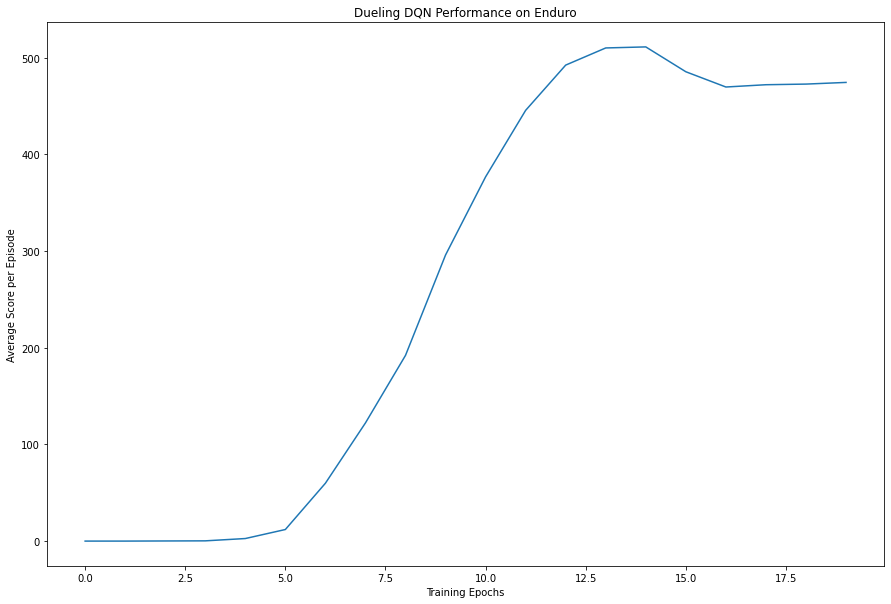

In [11]:
# History for average epoch score
plt.figure(figsize=(15, 10))
plt.plot(epoch_data['avg'])
plt.title('Dueling DQN Performance on Enduro')
plt.ylabel('Average Score per Episode')
plt.xlabel('Training Epochs')
plt.show()

A continuación se grafica la evolución del mejor score obtenido a través de las épocas de entrenamiento:

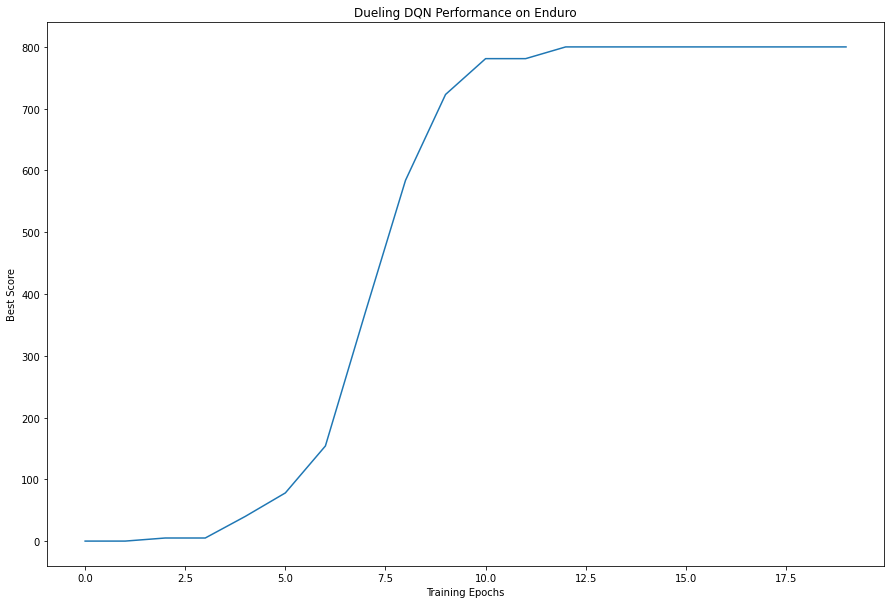

In [13]:
# History for best scores
global_best_scores = []
best = 0
for score in epoch_data['best']:
    best_score_yet = best
    if score > best:
        best_score_yet = score
        best = score
    global_best_scores.append(best_score_yet)
plt.figure(figsize=(15, 10))
plt.plot(global_best_scores)
plt.title('Dueling DQN Performance on Enduro')
plt.ylabel('Best Score')
plt.xlabel('Training Epochs')
plt.show()

Podemos ver que a partir de la 5ta época el modelo comienza a aprender **rápidamente,** hasta llegar a la época 13, en donde **alcanza su mejor momento.** Luego de esto decae un poco en su rendimiento, probablemente debido a que avanzó lo suficiente en el juego como para encontrarse con **muchos cambios de dificultad distintos** (visibilidad, frecuencia de autos rivales, cambios de contraste, etc...), los que **requieren seguir entrenando por largos períodos de tiempo** para poder superarlos de forma constante (o utilizar otra arquitectura o estrategia).

Para poder visualizar el rendimiento del modelo entrenado en el juego, se define una función de testing:

In [14]:
# Test trained network
def run_testing(model, max_steps):
    last_obs = env.reset()
    frames = []  # Save frames for animation
    for step in tqdm(range(max_steps), position=0, leave=True):
        current_state = torch.tensor(last_obs.__array__() / 255).float().unsqueeze(0).to(device)
        with torch.no_grad():
            action_values = model(current_state)
        action = torch.argmax(action_values, axis=1).item()
        obs, reward, done, info = env.step(action)
        frames.append(last_obs[0])
        if done:
            obs = env.reset()
            return frames
        last_obs = obs
    return frames

Se deja jugar al modelo por 3000 pasos:

In [15]:
testing_frames = run_testing(Q, 3000)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [00:09<00:00, 310.51it/s]


A continuación se genera una animación que permite ver a la máquina controlando el auto en el juego, según el testing realizado:

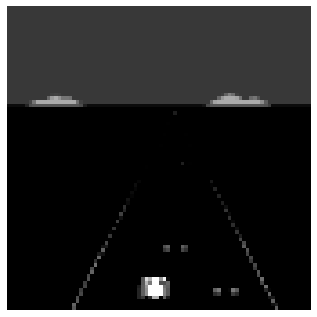

In [16]:
import matplotlib.animation
from IPython.display import HTML

# Visualize the trained network playing the game
frames_show = testing_frames[:3000]
plt.figure(figsize=(frames_show[0].shape[1] / 15.0, frames_show[0].shape[0] / 15.0), dpi=72)
patch = plt.imshow(frames_show[0], cmap='gray')
plt.axis('off')
animate = lambda i: patch.set_data(frames_show[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames_show), interval=100)
HTML(ani.to_jshtml())

Como conclusión, tenemos un rendimiento bastante bueno en **Enduro**, logrando vencer a jugadores principiantes (y probablemente intermedios) en este juego. La arquitectura **Dueling DQN** demuestra ser muy capaz para este tipo de problemas, aunque se traduce en un largo tiempo de entrenamiento.

## Referencias

[1] Ayudantía T3: https://colab.research.google.com/drive/1TW7jtdShtTw-_uW3IvHrlBjhfbB0rovg?usp=sharing

[2] Wang, Z., Schaul, T., Hessel, M., Hasselt, H., Lanctot, M., Freitas, N. (2016, June). Dueling network architectures for deep reinforcement learning. In International conference on machine learning (pp. 1995-2003). PMLR.

[3] Dueling Deep Q-Networks: https://towardsdatascience.com/dueling-deep-q-networks-81ffab672751

[4] Reinforcement Learning with PyTorch: https://pytorch.org/tutorials/intermediate/reinforcement_q_learning.html